In [1]:
!pip install diffusers transformers accelerate peft safetensors ftfy pillow numpy matplotlib tqdm opencv-python scikit-image

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 2.4 MB/s eta 0:00:00


In [2]:
# importsa nd setup
import os
import random
import numpy as np
import cv2
import torch
import torch.nn.functional as F
from PIL import Image
from pathlib import Path
from tqdm import tqdm
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from diffusers import StableDiffusionInpaintPipeline, DDPMScheduler
from peft import LoraConfig, get_peft_model
from torch.optim import AdamW
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

# Configuration
IMAGE_SIZE = 512
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {DEVICE}")

from google.colab import drive
drive.mount('/content/drive', force_remount=True)

# Paths
DAMAGED_DIR = Path("/content/drive/MyDrive/DL_Project/damaged images")
RAW_DIR = Path("/content/drive/MyDrive/DL_Project/Raw Images")
BASE_TRAIN_PATH = "/content/drive/MyDrive/DL_Project/train"
CLEAN_DIR = Path(BASE_TRAIN_PATH) / "clean images"
MASK_DIR = Path(BASE_TRAIN_PATH) / "mask"

# Create directories
CLEAN_DIR.mkdir(parents=True, exist_ok=True)
MASK_DIR.mkdir(parents=True, exist_ok=True)

Using device: cuda
Mounted at /content/drive


In [3]:
# preprocessing functions
def center_crop(img: Image.Image) -> Image.Image:
    width, height = img.size
    crop_size = min(width, height)
    left = (width - crop_size) // 2
    top = (height - crop_size) // 2
    right = left + crop_size
    bottom = top + crop_size
    return img.crop((left, top, right, bottom))

def normalize_color(img: Image.Image) -> Image.Image:
    img_cv = np.array(img)
    img_yuv = cv2.cvtColor(img_cv, cv2.COLOR_RGB2YUV)
    img_yuv[:, :, 0] = cv2.equalizeHist(img_yuv[:, :, 0])
    img_norm = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2RGB)
    return Image.fromarray(img_norm)

def remove_metadata(img: Image.Image) -> Image.Image:
    data = list(img.getdata())
    new_img = Image.new(img.mode, img.size)
    new_img.putdata(data)
    return new_img

# Process raw images to clean
if RAW_DIR.exists():
    print("Preprocessing raw images")
    for filename in tqdm(sorted(os.listdir(RAW_DIR))):
        if not filename.lower().endswith((".png", ".jpg", ".jpeg")):
            continue
        in_path = RAW_DIR / filename
        out_name = Path(filename).stem + ".png"
        out_path = CLEAN_DIR / out_name
        try:
            img = Image.open(in_path).convert("RGB")
            img = center_crop(img)
            img = img.resize((IMAGE_SIZE, IMAGE_SIZE), Image.LANCZOS)
            img = normalize_color(img)
            img = remove_metadata(img)
            img.save(out_path, format="PNG")
        except Exception as e:
            print(f"Error processing {filename}: {e}")
    print(f"Clean images saved to: {CLEAN_DIR}")

# Standardize damaged images
print("Standardizing damaged images")
for fname in tqdm(sorted(os.listdir(DAMAGED_DIR))):
    p = DAMAGED_DIR / fname
    try:
        img = Image.open(p).convert("RGB")
        if img.size != (IMAGE_SIZE, IMAGE_SIZE) or p.suffix.lower() != ".png":
            img = center_crop(img).resize((IMAGE_SIZE, IMAGE_SIZE), Image.LANCZOS)
            img = normalize_color(img)
            img = remove_metadata(img)
            out_name = Path(p).stem + ".png"
            img.save(DAMAGED_DIR / out_name, format="PNG")
            if p.suffix.lower() != ".png":
                p.unlink(missing_ok=True)
    except Exception as e:
        print(f"Skipping {p}: {e}")

Preprocessing raw images


100%|██████████| 105/105 [00:48<00:00,  2.18it/s]


Clean images saved to: /content/drive/MyDrive/DL_Project/train/clean images
Standardizing damaged images


100%|██████████| 109/109 [00:07<00:00, 14.23it/s]


Testing on: 001.png


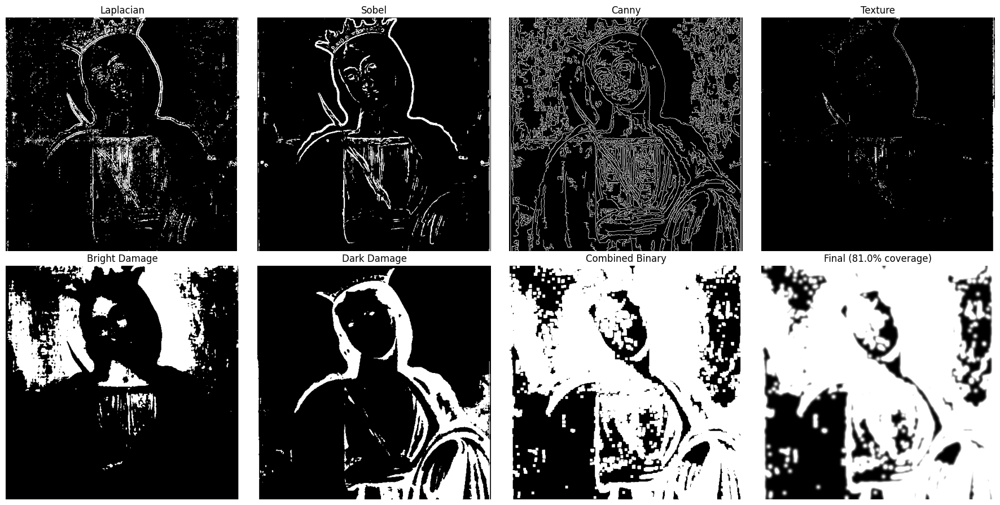

Mask coverage: 81.04%


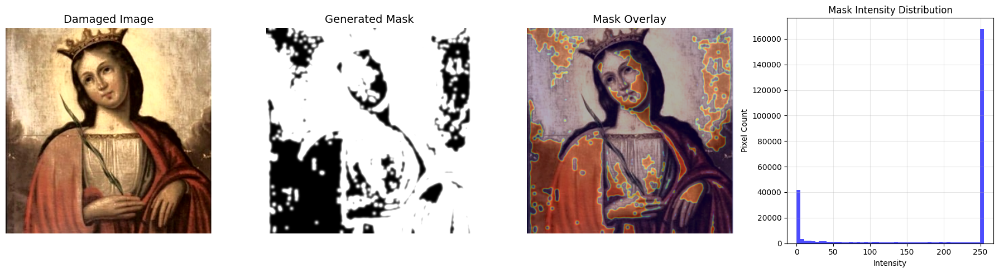


Mask Statistics:
Mean intensity: 185.01
Max intensity: 255
Non-zero pixels: 226,904 (86.56%)


In [4]:
def generate_optimized_damage_mask(img_pil, debug=False):
    """Optimized damage detection that preserves detected features"""
    img = np.array(img_pil)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # 1. Multi-scale Laplacian for cracks
    crack_mask = np.zeros_like(gray, dtype=np.float32)
    for ksize in [3, 5, 7]:
        laplacian = cv2.Laplacian(gray, cv2.CV_64F, ksize=ksize)
        laplacian = np.abs(laplacian)
        crack_mask += cv2.normalize(laplacian, None, 0, 1, cv2.NORM_MINMAX)

    crack_mask = cv2.normalize(crack_mask, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    _, crack_bin = cv2.threshold(crack_mask, 30, 255, cv2.THRESH_BINARY)

    # 2. Sobel edges
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    sobel = np.sqrt(sobelx**2 + sobely**2)
    sobel = cv2.normalize(sobel, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    _, sobel_mask = cv2.threshold(sobel, 40, 255, cv2.THRESH_BINARY)

    # 3. Canny edges
    edges = cv2.Canny(gray, 30, 100)

    # 4. LAB color space damage
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)

    # Bright damage (paint loss)
    _, bright_mask = cv2.threshold(l, 210, 255, cv2.THRESH_BINARY)

    # Dark damage (stains, shadows from cracks)
    _, dark_mask = cv2.threshold(l, 50, 255, cv2.THRESH_BINARY_INV)

    # 5. Texture damage detection
    blur = cv2.GaussianBlur(gray, (5, 5), 0)
    texture_diff = cv2.absdiff(gray, blur)
    _, texture_mask = cv2.threshold(texture_diff, 15, 255, cv2.THRESH_BINARY)

    # Combine all masks with equal weight
    combined = np.zeros_like(gray, dtype=np.float32)
    combined += crack_bin.astype(np.float32)
    combined += sobel_mask.astype(np.float32)
    combined += edges.astype(np.float32)
    combined += bright_mask.astype(np.float32)
    combined += dark_mask.astype(np.float32)
    combined += texture_mask.astype(np.float32)

    # Normalize to 0-255
    combined = cv2.normalize(combined, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # Threshold to get binary mask
    _, combined_binary = cv2.threshold(combined, 50, 255, cv2.THRESH_BINARY)

    # MINIMAL morphological operations (preserve detail)
    kernel_tiny = np.ones((2, 2), np.uint8)
    kernel_small = np.ones((3, 3), np.uint8)

    # Remove only the smallest noise
    combined_binary = cv2.morphologyEx(combined_binary, cv2.MORPH_OPEN, kernel_tiny, iterations=1)

    # Close small gaps
    combined_binary = cv2.morphologyEx(combined_binary, cv2.MORPH_CLOSE, kernel_small, iterations=2)

    # Moderate dilation to ensure coverage
    combined_binary = cv2.dilate(combined_binary, kernel_small, iterations=2)

    # Create soft mask with progressive blurring
    mask_soft = combined_binary.astype(np.float32)
    mask_soft = cv2.GaussianBlur(mask_soft, (11, 11), 0)
    mask_soft = cv2.GaussianBlur(mask_soft, (11, 11), 0)

    # Boost intensity
    mask_soft = np.clip(mask_soft * 1.8, 0, 255).astype(np.uint8)

    # Calculate coverage
    mask_coverage = np.sum(mask_soft > 20) / mask_soft.size * 100

    if debug:
        fig, axes = plt.subplots(2, 4, figsize=(18, 9))
        axes[0, 0].imshow(crack_bin, cmap='gray')
        axes[0, 0].set_title('Laplacian')
        axes[0, 0].axis('off')

        axes[0, 1].imshow(sobel_mask, cmap='gray')
        axes[0, 1].set_title('Sobel')
        axes[0, 1].axis('off')

        axes[0, 2].imshow(edges, cmap='gray')
        axes[0, 2].set_title('Canny')
        axes[0, 2].axis('off')

        axes[0, 3].imshow(texture_mask, cmap='gray')
        axes[0, 3].set_title('Texture')
        axes[0, 3].axis('off')

        axes[1, 0].imshow(bright_mask, cmap='gray')
        axes[1, 0].set_title('Bright Damage')
        axes[1, 0].axis('off')

        axes[1, 1].imshow(dark_mask, cmap='gray')
        axes[1, 1].set_title('Dark Damage')
        axes[1, 1].axis('off')

        axes[1, 2].imshow(combined_binary, cmap='gray')
        axes[1, 2].set_title('Combined Binary')
        axes[1, 2].axis('off')

        axes[1, 3].imshow(mask_soft, cmap='gray')
        axes[1, 3].set_title(f'Final ({mask_coverage:.1f}% coverage)')
        axes[1, 3].axis('off')

        plt.tight_layout()
        plt.show()

    print(f"Mask coverage: {mask_coverage:.2f}%")

    return mask_soft

# Test on the problematic image
test_files = sorted(os.listdir(DAMAGED_DIR))
test_file = test_files[0]  # or specify the one from your screenshot

print(f"Testing on: {test_file}")
test_img = Image.open(DAMAGED_DIR / test_file).convert("RGB")

test_mask = generate_optimized_damage_mask(test_img, debug=True)

# Show results
plt.figure(figsize=(18, 5))

plt.subplot(1, 4, 1)
plt.imshow(test_img)
plt.title("Damaged Image", fontsize=14)
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(test_mask, cmap='gray')
plt.title("Generated Mask", fontsize=14)
plt.axis('off')

plt.subplot(1, 4, 3)
overlay = np.array(test_img).copy()
mask_colored = cv2.applyColorMap(test_mask, cv2.COLORMAP_JET)
overlay = cv2.addWeighted(overlay, 0.7, mask_colored, 0.3, 0)
plt.imshow(overlay)
plt.title("Mask Overlay", fontsize=14)
plt.axis('off')

plt.subplot(1, 4, 4)
# Show mask intensity histogram
plt.hist(test_mask.flatten(), bins=50, color='blue', alpha=0.7)
plt.xlabel('Intensity')
plt.ylabel('Pixel Count')
plt.title('Mask Intensity Distribution')
plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()

print("\n" + "="*60)
print("Mask Statistics:")
print(f"Mean intensity: {np.mean(test_mask):.2f}")
print(f"Max intensity: {np.max(test_mask)}")
print(f"Non-zero pixels: {np.count_nonzero(test_mask):,} ({np.count_nonzero(test_mask)/test_mask.size*100:.2f}%)")
print("="*60)

In [5]:
print("Generating masks for all images...")

mask_stats = []

for fname in tqdm(sorted(os.listdir(DAMAGED_DIR))):
    if not fname.lower().endswith((".png", ".jpg", ".jpeg")):
        continue

    damaged_path = DAMAGED_DIR / fname
    img_pil = Image.open(damaged_path).convert("RGB")

    mask_np = generate_optimized_damage_mask(img_pil, debug=False)
    mask_pil = Image.fromarray(mask_np).convert("L")

    # Track statistics
    coverage = np.sum(mask_np > 20) / mask_np.size * 100
    mean_intensity = np.mean(mask_np)
    mask_stats.append({
        'file': fname,
        'coverage': coverage,
        'mean_intensity': mean_intensity
    })

    save_path = MASK_DIR / fname
    mask_pil.save(save_path)

print("\nMask generation complete!")
print(f"\nOverall Statistics:")
print(f"Average coverage: {np.mean([s['coverage'] for s in mask_stats]):.2f}%")
print(f"Average intensity: {np.mean([s['mean_intensity'] for s in mask_stats]):.2f}")

# Show images with lowest coverage (potential problems)
mask_stats_sorted = sorted(mask_stats, key=lambda x: x['coverage'])
print(f"\nImages with lowest mask coverage (check these):")
for stat in mask_stats_sorted[:5]:
    print(f"  {stat['file']}: {stat['coverage']:.2f}% coverage")

Generating masks for all images...


  2%|▏         | 2/109 [00:00<00:08, 13.34it/s]

Mask coverage: 81.04%
Mask coverage: 99.99%
Mask coverage: 83.68%
Mask coverage: 95.75%


  4%|▎         | 4/109 [00:00<00:06, 15.75it/s]

Mask coverage: 89.05%
Mask coverage: 100.00%
Mask coverage: 94.37%


  6%|▋         | 7/109 [00:00<00:05, 18.52it/s]

Mask coverage: 98.17%
Mask coverage: 100.00%


  9%|▉         | 10/109 [00:00<00:04, 20.01it/s]

Mask coverage: 73.81%
Mask coverage: 99.85%
Mask coverage: 100.00%


 12%|█▏        | 13/109 [00:00<00:04, 20.49it/s]

Mask coverage: 99.89%
Mask coverage: 99.66%


 15%|█▍        | 16/109 [00:00<00:04, 20.05it/s]

Mask coverage: 94.20%
Mask coverage: 98.21%
Mask coverage: 87.61%
Mask coverage: 98.45%
Mask coverage: 99.96%


 17%|█▋        | 19/109 [00:00<00:04, 20.14it/s]

Mask coverage: 99.92%
Mask coverage: 99.50%
Mask coverage: 88.70%


 20%|██        | 22/109 [00:01<00:04, 20.21it/s]

Mask coverage: 100.00%
Mask coverage: 90.05%


 23%|██▎       | 25/109 [00:01<00:04, 20.44it/s]

Mask coverage: 87.21%
Mask coverage: 100.00%


 26%|██▌       | 28/109 [00:01<00:04, 19.84it/s]

Mask coverage: 92.55%
Mask coverage: 99.96%
Mask coverage: 88.49%


 28%|██▊       | 30/109 [00:01<00:04, 19.68it/s]

Mask coverage: 83.38%
Mask coverage: 99.68%
Mask coverage: 95.90%
Mask coverage: 96.86%


 30%|███       | 33/109 [00:01<00:03, 20.30it/s]

Mask coverage: 97.27%
Mask coverage: 71.76%
Mask coverage: 97.52%


 33%|███▎      | 36/109 [00:01<00:03, 20.47it/s]

Mask coverage: 79.01%
Mask coverage: 99.67%


 36%|███▌      | 39/109 [00:01<00:03, 19.53it/s]

Mask coverage: 99.72%
Mask coverage: 99.83%
Mask coverage: 78.66%


 38%|███▊      | 41/109 [00:02<00:04, 15.81it/s]

Mask coverage: 99.62%


 39%|███▉      | 43/109 [00:02<00:04, 13.50it/s]

Mask coverage: 94.85%
Mask coverage: 79.89%


 41%|████▏     | 45/109 [00:02<00:05, 11.42it/s]

Mask coverage: 86.08%
Mask coverage: 92.11%
Mask coverage: 96.35%


 43%|████▎     | 47/109 [00:02<00:06,  9.93it/s]

Mask coverage: 87.87%


 45%|████▍     | 49/109 [00:03<00:06,  9.58it/s]

Mask coverage: 95.33%
Mask coverage: 84.05%


 47%|████▋     | 51/109 [00:03<00:06,  9.34it/s]

Mask coverage: 79.39%


 48%|████▊     | 52/109 [00:03<00:06,  9.10it/s]

Mask coverage: 96.58%


 49%|████▊     | 53/109 [00:03<00:06,  9.05it/s]

Mask coverage: 84.10%


 50%|████▉     | 54/109 [00:03<00:06,  8.79it/s]

Mask coverage: 90.15%


 50%|█████     | 55/109 [00:03<00:06,  8.90it/s]

Mask coverage: 98.67%
Mask coverage: 99.74%


 52%|█████▏    | 57/109 [00:04<00:05,  9.88it/s]

Mask coverage: 99.48%


 53%|█████▎    | 58/109 [00:04<00:05,  9.66it/s]

Mask coverage: 96.81%
Mask coverage: 99.27%
Mask coverage: 88.60%


 57%|█████▋    | 62/109 [00:04<00:05,  8.56it/s]

Mask coverage: 96.26%
Mask coverage: 99.87%


 58%|█████▊    | 63/109 [00:04<00:05,  8.76it/s]

Mask coverage: 95.92%
Mask coverage: 98.82%
Mask coverage: 100.00%


 61%|██████▏   | 67/109 [00:05<00:04,  9.59it/s]

Mask coverage: 99.49%
Mask coverage: 70.26%
Mask coverage: 75.12%


 65%|██████▌   | 71/109 [00:05<00:03, 10.97it/s]

Mask coverage: 100.00%
Mask coverage: 97.77%
Mask coverage: 87.25%


 67%|██████▋   | 73/109 [00:05<00:03, 10.75it/s]

Mask coverage: 77.20%
Mask coverage: 97.80%
Mask coverage: 99.05%


 71%|███████   | 77/109 [00:05<00:02, 11.76it/s]

Mask coverage: 99.81%
Mask coverage: 64.57%
Mask coverage: 99.08%
Mask coverage: 98.43%


 74%|███████▍  | 81/109 [00:06<00:02, 13.22it/s]

Mask coverage: 98.06%
Mask coverage: 96.45%
Mask coverage: 93.71%
Mask coverage: 94.64%


 78%|███████▊  | 85/109 [00:06<00:01, 13.44it/s]

Mask coverage: 99.67%
Mask coverage: 78.57%
Mask coverage: 86.75%


 80%|███████▉  | 87/109 [00:06<00:01, 13.86it/s]

Mask coverage: 99.80%
Mask coverage: 99.75%
Mask coverage: 93.39%
Mask coverage: 78.68%


 83%|████████▎ | 91/109 [00:06<00:01, 14.31it/s]

Mask coverage: 99.34%
Mask coverage: 87.87%
Mask coverage: 83.43%


 87%|████████▋ | 95/109 [00:07<00:00, 14.15it/s]

Mask coverage: 79.08%
Mask coverage: 91.06%
Mask coverage: 99.92%


 89%|████████▉ | 97/109 [00:07<00:00, 13.78it/s]

Mask coverage: 97.95%
Mask coverage: 88.44%
Mask coverage: 99.94%


 93%|█████████▎| 101/109 [00:07<00:00, 13.77it/s]

Mask coverage: 83.33%
Mask coverage: 93.19%
Mask coverage: 97.12%


 94%|█████████▍| 103/109 [00:07<00:00, 14.11it/s]

Mask coverage: 99.40%
Mask coverage: 77.52%
Mask coverage: 74.65%


 98%|█████████▊| 107/109 [00:08<00:00, 14.24it/s]

Mask coverage: 91.93%
Mask coverage: 70.54%
Mask coverage: 78.25%


100%|██████████| 109/109 [00:08<00:00, 13.26it/s]

Mask coverage: 87.61%
Mask coverage: 87.05%

Mask generation complete!

Overall Statistics:
Average coverage: 92.04%
Average intensity: 220.81

Images with lowest mask coverage (check these):
  078.png: 64.57% coverage
  069.png: 70.26% coverage
  108.png: 70.54% coverage
  036.png: 71.76% coverage
  011.png: 73.81% coverage


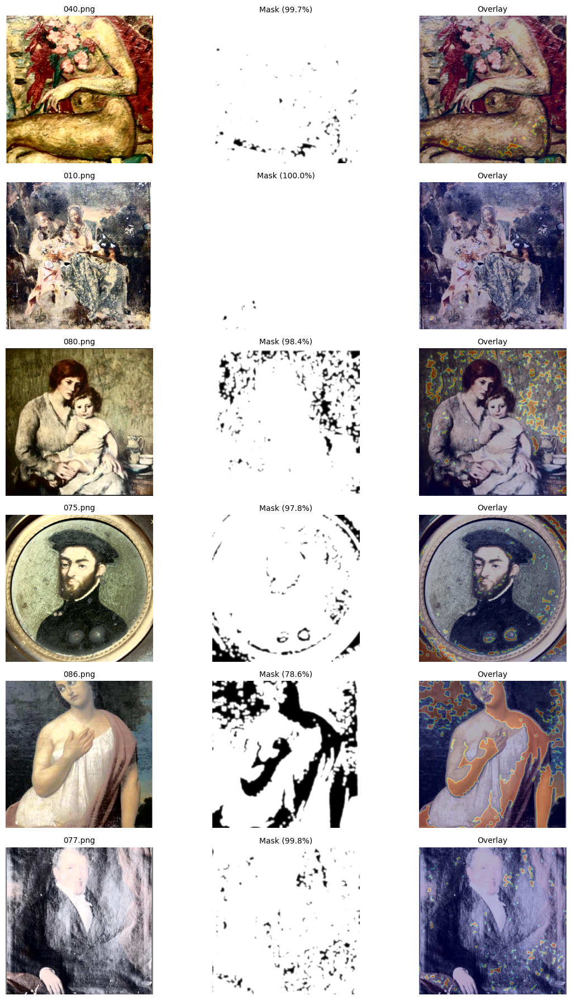

In [6]:
# Visually inspect several masks
num_samples = 6
sample_files = random.sample([f for f in os.listdir(DAMAGED_DIR) if f.endswith('.png')], min(num_samples, len(os.listdir(DAMAGED_DIR))))

fig, axes = plt.subplots(num_samples, 3, figsize=(12, num_samples*3))

for idx, fname in enumerate(sample_files):
    damaged = Image.open(DAMAGED_DIR / fname).convert("RGB")
    mask = Image.open(MASK_DIR / fname).convert("L")

    # Show damaged
    axes[idx, 0].imshow(damaged)
    axes[idx, 0].set_title(f"{fname}", fontsize=10)
    axes[idx, 0].axis('off')

    # Show mask
    axes[idx, 1].imshow(mask, cmap='gray')
    coverage = np.sum(np.array(mask) > 20) / np.array(mask).size * 100
    axes[idx, 1].set_title(f"Mask ({coverage:.1f}%)", fontsize=10)
    axes[idx, 1].axis('off')

    # Show overlay
    overlay = np.array(damaged).copy()
    mask_np = np.array(mask)
    mask_colored = cv2.applyColorMap(mask_np, cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(overlay, 0.7, mask_colored, 0.3, 0)
    axes[idx, 2].imshow(overlay)
    axes[idx, 2].set_title("Overlay", fontsize=10)
    axes[idx, 2].axis('off')

plt.tight_layout()
plt.show()

In [7]:
# setup model config

print("Loading Stable Diffusion Inpainting model...")

pipe = StableDiffusionInpaintPipeline.from_pretrained(
    "runwayml/stable-diffusion-inpainting",
    torch_dtype=torch.float16,
    use_safetensors=False,
    variant=None
).to(DEVICE)

pipe.scheduler = DDPMScheduler.from_pretrained(
    "runwayml/stable-diffusion-inpainting",
    subfolder="scheduler"
)

# Optimize memory
pipe.safety_checker = None
pipe.requires_safety_checker = False
pipe.enable_attention_slicing()
pipe.enable_vae_slicing()

# Freeze VAE and text encoder
pipe.vae.eval()
pipe.text_encoder.eval()
pipe.vae.requires_grad_(False)
pipe.text_encoder.requires_grad_(False)

# UNet in FP32 for training stability
pipe.unet.to(device=DEVICE, dtype=torch.float32)
pipe.unet.requires_grad_(False)

print("Base model ready!")

Loading Stable Diffusion Inpainting model...


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

config.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/748 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

scheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

safety_checker/pytorch_model.bin:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

text_encoder/pytorch_model.bin:   0%|          | 0.00/492M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/552 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.bin:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.bin:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


Base model ready!


In [8]:
# Enhanced LoRA configuration
lora_config = LoraConfig(
    r=32,  # Increased rank for better capacity
    lora_alpha=64,  # Increased alpha for stronger adaptation
    target_modules=["to_q", "to_k", "to_v", "to_out.0"],
    lora_dropout=0.1,
    bias="none"
)

pipe.unet = get_peft_model(pipe.unet, lora_config)
pipe.unet.print_trainable_parameters()

print("Enhanced LoRA attached successfully!")

trainable params: 6,377,472 || all params: 865,912,836 || trainable%: 0.7365
Enhanced LoRA attached successfully!


In [9]:
# dataset and dataloader

class RestorationDataset(Dataset):
    def __init__(self):
        clean_files = set(os.listdir(CLEAN_DIR))
        damaged_files = set(os.listdir(DAMAGED_DIR))
        mask_files = set(os.listdir(MASK_DIR))

        self.files = sorted(clean_files & damaged_files & mask_files)
        print(f"Total aligned samples: {len(self.files)}")

        self.img_tf = transforms.Compose([
            transforms.Resize((512, 512)),
            transforms.ToTensor(),
        ])

        self.mask_tf = transforms.Compose([
            transforms.Resize((512, 512)),
            transforms.ToTensor(),
        ])

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        fname = self.files[idx]

        clean = Image.open(CLEAN_DIR / fname).convert("RGB")
        damaged = Image.open(DAMAGED_DIR / fname).convert("RGB")
        mask = Image.open(MASK_DIR / fname).convert("L")

        return {
            "clean": self.img_tf(clean),
            "damaged": self.img_tf(damaged),
            "mask": self.mask_tf(mask),
        }

dataset = RestorationDataset()

loader = DataLoader(
    dataset,
    batch_size=1,
    shuffle=True,
    num_workers=0,
    pin_memory=True
)

print(f"DataLoader ready | Batches: {len(loader)}")

Total aligned samples: 105
DataLoader ready | Batches: 105


In [10]:
pipe.unet.train()

LR = 5e-6  # Lower learning rate for stability
EPOCHS = 10  # More epochs for better learning
ACCUMULATION_STEPS = 4  # Gradient accumulation

optimizer = AdamW(pipe.unet.parameters(), lr=LR, weight_decay=1e-4)

# Learning rate scheduler
from torch.optim.lr_scheduler import CosineAnnealingLR
scheduler = CosineAnnealingLR(optimizer, T_max=EPOCHS, eta_min=1e-7)

print("Starting enhanced training...")

for epoch in range(EPOCHS):
    total_loss = 0.0
    valid_steps = 0

    progress_bar = tqdm(loader, desc=f"Epoch {epoch+1}/{EPOCHS}")

    for batch_idx, batch in enumerate(progress_bar):
        clean = batch["clean"].to(DEVICE).to(torch.float32)
        damaged = batch["damaged"].to(DEVICE).to(torch.float32)
        mask = torch.clamp(batch["mask"].to(DEVICE).to(torch.float32), 0, 1)

        # Encode to latents
        with torch.no_grad():
            clean_latents = pipe.vae.encode(clean.to(torch.float16)).latent_dist.sample().to(torch.float32) * 0.18215
            damaged_latents = pipe.vae.encode(damaged.to(torch.float16)).latent_dist.sample().to(torch.float32) * 0.18215

            # Resize mask to latent space
            mask_latent = F.interpolate(mask, size=clean_latents.shape[-2:], mode="nearest")
            mask_latent = (mask_latent > 0.3).to(torch.float32)  # Lower threshold for better coverage

        # Sample noise and timesteps
        noise = torch.randn_like(clean_latents)
        timesteps = torch.randint(
            0,
            pipe.scheduler.config.num_train_timesteps,
            (clean_latents.shape[0],),
            device=DEVICE
        ).long()

        # Add noise to clean latents
        noisy_latents = pipe.scheduler.add_noise(clean_latents, noise, timesteps)

        # Create masked input
        masked_latents = damaged_latents * (1 - mask_latent) + noisy_latents * mask_latent

        # Concatenate inputs
        latent_model_input = torch.cat([noisy_latents, masked_latents, mask_latent], dim=1)

        # Text conditioning
        prompts = ["professional photo restoration, repair damage, preserve details"] * clean_latents.shape[0]
        inputs = pipe.tokenizer(
            prompts,
            padding="max_length",
            truncation=True,
            max_length=pipe.tokenizer.model_max_length,
            return_tensors="pt"
        )

        input_ids = inputs.input_ids.to(DEVICE)

        with torch.no_grad():
            encoder_hidden_states = pipe.text_encoder(input_ids)[0].to(torch.float32)

        # Forward pass
        model_pred = pipe.unet(
            latent_model_input,
            timesteps,
            encoder_hidden_states=encoder_hidden_states
        ).sample

        # Enhanced loss computation
        # Weighted MSE emphasizing damaged regions
        weight_mask = mask_latent * 3.0 + 0.5  # Higher weight on damaged areas
        mse_loss = F.mse_loss(model_pred * weight_mask, noise * weight_mask)

        # Perceptual loss component (L1 loss on predictions)
        l1_loss = F.l1_loss(model_pred, noise)

        # Combined loss
        loss = mse_loss + 0.1 * l1_loss

        # Gradient accumulation
        loss = loss / ACCUMULATION_STEPS
        loss.backward()

        if (batch_idx + 1) % ACCUMULATION_STEPS == 0:
            torch.nn.utils.clip_grad_norm_(pipe.unet.parameters(), 1.0)
            optimizer.step()
            optimizer.zero_grad()

        total_loss += loss.item() * ACCUMULATION_STEPS
        valid_steps += 1

        progress_bar.set_postfix({"loss": loss.item() * ACCUMULATION_STEPS})

    # Step scheduler
    scheduler.step()

    avg_loss = total_loss / max(1, valid_steps)
    print(f"Epoch {epoch+1} DONE | Avg Loss: {avg_loss:.6f} | LR: {scheduler.get_last_lr()[0]:.2e}")

# Save trained model
SAVE_PATH = "/content/drive/MyDrive/DL_Project/Final Trained Enhanced"
os.makedirs(SAVE_PATH, exist_ok=True)

pipe.unet.save_pretrained(SAVE_PATH)
print(f"Enhanced LoRA saved at: {SAVE_PATH}")

Starting enhanced training...


Epoch 1/10: 100%|██████████| 105/105 [01:38<00:00,  1.06it/s, loss=1.55]


Epoch 1 DONE | Avg Loss: 3.146416 | LR: 4.88e-06


Epoch 2/10: 100%|██████████| 105/105 [01:35<00:00,  1.10it/s, loss=0.742]


Epoch 2 DONE | Avg Loss: 2.818875 | LR: 4.53e-06


Epoch 3/10: 100%|██████████| 105/105 [01:35<00:00,  1.10it/s, loss=3.77]


Epoch 3 DONE | Avg Loss: 3.068509 | LR: 3.99e-06


Epoch 4/10: 100%|██████████| 105/105 [01:35<00:00,  1.10it/s, loss=2.4]


Epoch 4 DONE | Avg Loss: 2.894699 | LR: 3.31e-06


Epoch 5/10: 100%|██████████| 105/105 [01:35<00:00,  1.10it/s, loss=1.82]


Epoch 5 DONE | Avg Loss: 2.713124 | LR: 2.55e-06


Epoch 6/10: 100%|██████████| 105/105 [01:35<00:00,  1.10it/s, loss=4.91]


Epoch 6 DONE | Avg Loss: 3.410899 | LR: 1.79e-06


Epoch 7/10: 100%|██████████| 105/105 [01:35<00:00,  1.10it/s, loss=0.134]


Epoch 7 DONE | Avg Loss: 2.518746 | LR: 1.11e-06


Epoch 8/10: 100%|██████████| 105/105 [01:35<00:00,  1.10it/s, loss=0.0931]


Epoch 8 DONE | Avg Loss: 2.313404 | LR: 5.68e-07


Epoch 9/10: 100%|██████████| 105/105 [01:35<00:00,  1.10it/s, loss=1.39]


Epoch 9 DONE | Avg Loss: 2.132528 | LR: 2.20e-07


Epoch 10/10: 100%|██████████| 105/105 [01:36<00:00,  1.09it/s, loss=2.85]

Epoch 10 DONE | Avg Loss: 2.583710 | LR: 1.00e-07
Enhanced LoRA saved at: /content/drive/MyDrive/DL_Project/Final Trained Enhanced


In [11]:
print("Loading model for inference")

# Load base model
pipe = StableDiffusionInpaintPipeline.from_pretrained(
    "runwayml/stable-diffusion-inpainting",
    torch_dtype=torch.float16 if DEVICE == "cuda" else torch.float32
).to(DEVICE)

pipe.safety_checker = None
pipe.requires_safety_checker = False

# Load trained LoRA
pipe.load_lora_weights("/content/drive/MyDrive/DL_Project/Final Trained Enhanced")

pipe.enable_attention_slicing()
pipe.enable_vae_slicing()

pipe.unet.eval()
pipe.vae.eval()
pipe.text_encoder.eval()

print("Trained LoRA loaded for testing!")

Loading model for inference


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
No LoRA keys associated to UNet2DConditionModel found with the pre

Trained LoRA loaded for testing!


In [12]:
# Create comparison directory
COMPARISON_DIR = Path("/content/drive/MyDrive/DL_Project/comparisons")
COMPARISON_DIR.mkdir(parents=True, exist_ok=True)

print(f"Creating comparison images")

damaged_files = sorted([f for f in os.listdir(DAMAGED_DIR) if f.lower().endswith(('.png', '.jpg', '.jpeg'))])

for fname in tqdm(damaged_files[:20], desc="Creating comparisons"):  # First 20 for quick preview
    try:
        # Load all versions
        damaged_pil = Image.open(DAMAGED_DIR / fname).convert("RGB").resize((512, 512))
        mask_pil = Image.open(MASK_DIR / fname).convert("L").resize((512, 512))
        clean_pil = Image.open(CLEAN_DIR / fname).convert("RGB").resize((512, 512))
        restored_name = Path(fname).stem + "_restored.png"
        restored_pil = Image.open(RESTORED_DIR / restored_name).convert("RGB")

        # Create comparison grid
        fig, axes = plt.subplots(1, 4, figsize=(20, 5))

        axes[0].imshow(damaged_pil)
        axes[0].set_title("Damaged", fontsize=14)
        axes[0].axis("off")

        axes[1].imshow(mask_pil, cmap="gray")
        axes[1].set_title("Mask", fontsize=14)
        axes[1].axis("off")

        axes[2].imshow(restored_pil)
        axes[2].set_title("Restored", fontsize=14)
        axes[2].axis("off")

        axes[3].imshow(clean_pil)
        axes[3].set_title("Original Clean", fontsize=14)
        axes[3].axis("off")

        plt.tight_layout()

        # Save comparison
        comparison_name = Path(fname).stem + "_comparison.png"
        plt.savefig(COMPARISON_DIR / comparison_name, dpi=150, bbox_inches='tight')
        plt.close()

    except Exception as e:
        print(f"Error creating comparison for {fname}: {e}")

print(f"\nComparison images saved to: {COMPARISON_DIR}")

Creating comparison images


Creating comparisons:   0%|          | 0/20 [00:00<?, ?it/s]

Error creating comparison for 001.png: name 'RESTORED_DIR' is not defined


Creating comparisons:  10%|█         | 2/20 [00:00<00:02,  8.01it/s]

Error creating comparison for 002.png: [Errno 2] No such file or directory: '/content/drive/MyDrive/DL_Project/train/clean images/002.png'


Creating comparisons:  30%|███       | 6/20 [00:00<00:00, 18.09it/s]

Error creating comparison for 003.png: name 'RESTORED_DIR' is not defined
Error creating comparison for 004.png: name 'RESTORED_DIR' is not defined
Error creating comparison for 005.png: name 'RESTORED_DIR' is not defined
Error creating comparison for 006.png: name 'RESTORED_DIR' is not defined
Error creating comparison for 007.png: name 'RESTORED_DIR' is not defined
Error creating comparison for 009.png: name 'RESTORED_DIR' is not defined
Error creating comparison for 010.png: name 'RESTORED_DIR' is not defined


Creating comparisons:  70%|███████   | 14/20 [00:00<00:00, 26.73it/s]

Error creating comparison for 011.png: name 'RESTORED_DIR' is not defined
Error creating comparison for 012.png: name 'RESTORED_DIR' is not defined
Error creating comparison for 013.png: name 'RESTORED_DIR' is not defined
Error creating comparison for 014.png: name 'RESTORED_DIR' is not defined
Error creating comparison for 015.png: name 'RESTORED_DIR' is not defined
Error creating comparison for 016.png: name 'RESTORED_DIR' is not defined


Creating comparisons: 100%|██████████| 20/20 [00:00<00:00, 24.51it/s]

Error creating comparison for 017.png: name 'RESTORED_DIR' is not defined
Error creating comparison for 018.png: name 'RESTORED_DIR' is not defined
Error creating comparison for 019.png: name 'RESTORED_DIR' is not defined
Error creating comparison for 020.png: name 'RESTORED_DIR' is not defined
Error creating comparison for 021.png: [Errno 2] No such file or directory: '/content/drive/MyDrive/DL_Project/train/clean images/021.png'

Comparison images saved to: /content/drive/MyDrive/DL_Project/comparisons


Testing hybrid restoration on: 005.png


  0%|          | 0/13 [00:00<?, ?it/s]

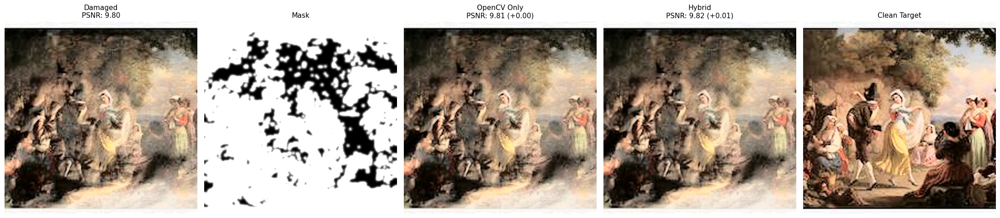


OpenCV Only: PSNR +0.00 dB, SSIM +0.0083
Hybrid:      PSNR +0.01 dB, SSIM +0.0110


In [13]:
def hybrid_restoration(damaged_pil, mask_pil, use_ai=True):
    """
    Combines OpenCV inpainting (for style preservation)
    with light AI enhancement (for quality)
    """
    damaged_np = np.array(damaged_pil).astype(np.float32)
    mask_np = np.array(mask_pil).astype(np.float32) / 255.0

    # Check if mask has enough content
    mask_coverage = np.sum(mask_np > 0.1) / mask_np.size * 100

    if mask_coverage < 1.0:
        # Too little damage, return original
        return damaged_pil

    # Step 1: OpenCV inpainting (style-preserving base)
    damaged_uint8 = damaged_np.astype(np.uint8)
    mask_uint8 = (mask_np * 255).astype(np.uint8)
    mask_inv = 255 - mask_uint8

    inpainted_ns = cv2.inpaint(damaged_uint8, mask_inv, 7, cv2.INPAINT_NS)
    inpainted_telea = cv2.inpaint(damaged_uint8, mask_inv, 7, cv2.INPAINT_TELEA)

    # Blend both OpenCV methods
    cv_result = (0.6 * inpainted_ns + 0.4 * inpainted_telea).astype(np.uint8)

    if use_ai and mask_coverage > 5.0:
        # Step 2: Light AI refinement only if significant damage
        cv_result_pil = Image.fromarray(cv_result)

        # Reduce mask strength for AI
        mask_reduced = (mask_np * 0.5).clip(0, 1)
        mask_reduced = cv2.GaussianBlur(mask_reduced, (21, 21), 0)
        mask_reduced_pil = Image.fromarray((mask_reduced * 255).astype(np.uint8)).convert("L")

        with torch.no_grad():
            ai_result = pipe(
                prompt="subtle texture repair, match surrounding style exactly, painting texture",
                negative_prompt="photorealistic, photograph, smooth, modern, different face, identity change",
                image=cv_result_pil,
                mask_image=mask_reduced_pil,
                num_inference_steps=30,
                guidance_scale=3.5,
                strength=0.45
            ).images[0]

        ai_np = np.array(ai_result).astype(np.float32)
        cv_np = np.array(cv_result).astype(np.float32)

        # Blend AI with OpenCV (60% OpenCV, 40% AI)
        blended = cv_np * 0.6 + ai_np * 0.4
    else:
        blended = cv_result.astype(np.float32)

    # Step 3: Final blending with original
    mask_smooth = cv2.GaussianBlur(mask_np, (31, 31), 0)
    mask_smooth = np.clip(mask_smooth * 0.8, 0, 1)  # Reduce to 80%

    final = blended * mask_smooth[..., None] + damaged_np * (1 - mask_smooth[..., None])

    # Color correction to match original
    for c in range(3):
        orig_mean = np.mean(damaged_np[:, :, c])
        orig_std = np.std(damaged_np[:, :, c])
        final_mean = np.mean(final[:, :, c])
        final_std = np.std(final[:, :, c])

        if final_std > 0:
            final[:, :, c] = (final[:, :, c] - final_mean) * (orig_std / final_std) + orig_mean

    final = np.clip(final, 0, 255).astype(np.uint8)

    return Image.fromarray(final)

# Test
fname = "005.png"
print(f"Testing hybrid restoration on: {fname}")

damaged_pil = Image.open(DAMAGED_DIR / fname).convert("RGB").resize((512, 512))
mask_pil = Image.open(MASK_DIR / fname).convert("L").resize((512, 512))
clean_pil = Image.open(CLEAN_DIR / fname).convert("RGB").resize((512, 512))

# Try both modes
restored_cv_only = hybrid_restoration(damaged_pil, mask_pil, use_ai=False)
restored_hybrid = hybrid_restoration(damaged_pil, mask_pil, use_ai=True)

# Metrics
clean_np = np.array(clean_pil).astype(np.float32)
damaged_np = np.array(damaged_pil).astype(np.float32)
cv_np = np.array(restored_cv_only).astype(np.float32)
hybrid_np = np.array(restored_hybrid).astype(np.float32)

psnr_d = psnr(clean_np, damaged_np, data_range=255)
psnr_cv = psnr(clean_np, cv_np, data_range=255)
psnr_h = psnr(clean_np, hybrid_np, data_range=255)

ssim_d = ssim(clean_np, damaged_np, data_range=255, channel_axis=2)
ssim_cv = ssim(clean_np, cv_np, data_range=255, channel_axis=2)
ssim_h = ssim(clean_np, hybrid_np, data_range=255, channel_axis=2)

# Display
fig, axes = plt.subplots(1, 5, figsize=(22, 5))

axes[0].imshow(damaged_pil)
axes[0].set_title(f"Damaged\nPSNR: {psnr_d:.2f}", fontsize=11)
axes[0].axis('off')

axes[1].imshow(mask_pil, cmap='gray')
axes[1].set_title("Mask", fontsize=11)
axes[1].axis('off')

axes[2].imshow(restored_cv_only)
axes[2].set_title(f"OpenCV Only\nPSNR: {psnr_cv:.2f} ({psnr_cv-psnr_d:+.2f})", fontsize=11)
axes[2].axis('off')

axes[3].imshow(restored_hybrid)
axes[3].set_title(f"Hybrid\nPSNR: {psnr_h:.2f} ({psnr_h-psnr_d:+.2f})", fontsize=11)
axes[3].axis('off')

axes[4].imshow(clean_pil)
axes[4].set_title("Clean Target", fontsize=11)
axes[4].axis('off')

plt.tight_layout()
plt.show()

print(f"\nOpenCV Only: PSNR {psnr_cv-psnr_d:+.2f} dB, SSIM {ssim_cv-ssim_d:+.4f}")
print(f"Hybrid:      PSNR {psnr_h-psnr_d:+.2f} dB, SSIM {ssim_h-ssim_d:+.4f}")

In [14]:
RESTORED_DIR = Path("/content/drive/MyDrive/DL_Project/restored images hybrid")
RESTORED_DIR.mkdir(parents=True, exist_ok=True)

print("Generating hybrid restorations...")

use_ai = True  # Set to False for OpenCV-only (faster)

for fname in tqdm(sorted(os.listdir(DAMAGED_DIR))):
    if not fname.lower().endswith(('.png', '.jpg', '.jpeg')):
        continue

    try:
        damaged_pil = Image.open(DAMAGED_DIR / fname).convert("RGB").resize((512, 512))
        mask_pil = Image.open(MASK_DIR / fname).convert("L").resize((512, 512))

        restored = hybrid_restoration(damaged_pil, mask_pil, use_ai=use_ai)

        output_name = Path(fname).stem + "_restored.png"
        restored.save(RESTORED_DIR / output_name)

    except Exception as e:
        print(f"\nError: {fname}: {e}")

print(f"\nSaved to: {RESTORED_DIR}")

Generating hybrid restorations...


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  1%|          | 1/109 [00:04<07:55,  4.40s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

  2%|▏         | 2/109 [00:07<06:38,  3.72s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

  3%|▎         | 3/109 [00:12<07:09,  4.05s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

  4%|▎         | 4/109 [00:16<07:05,  4.05s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

  5%|▍         | 5/109 [00:20<07:04,  4.08s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

  6%|▌         | 6/109 [00:23<06:32,  3.81s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

  6%|▋         | 7/109 [00:28<06:53,  4.06s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

  7%|▋         | 8/109 [00:31<06:42,  3.99s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

  8%|▊         | 9/109 [00:35<06:18,  3.78s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

  9%|▉         | 10/109 [00:39<06:41,  4.05s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 10%|█         | 11/109 [00:43<06:20,  3.89s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 11%|█         | 12/109 [00:46<05:59,  3.70s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 12%|█▏        | 13/109 [00:50<05:44,  3.59s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 13%|█▎        | 14/109 [00:53<05:42,  3.61s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 14%|█▍        | 15/109 [00:57<05:46,  3.68s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 15%|█▍        | 16/109 [01:01<05:42,  3.69s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 16%|█▌        | 17/109 [01:05<05:53,  3.85s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 17%|█▋        | 18/109 [01:09<05:45,  3.79s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 17%|█▋        | 19/109 [01:12<05:26,  3.63s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 18%|█▊        | 20/109 [01:15<05:17,  3.57s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 19%|█▉        | 21/109 [01:19<05:15,  3.59s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 20%|██        | 22/109 [01:23<05:29,  3.79s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 21%|██        | 23/109 [01:26<05:11,  3.62s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 22%|██▏       | 24/109 [01:31<05:22,  3.80s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 23%|██▎       | 25/109 [01:35<05:36,  4.00s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 24%|██▍       | 26/109 [01:38<05:13,  3.77s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 25%|██▍       | 27/109 [01:42<05:13,  3.82s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 26%|██▌       | 28/109 [01:46<04:59,  3.70s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 27%|██▋       | 29/109 [01:50<05:10,  3.89s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 28%|██▊       | 30/109 [01:54<05:15,  3.99s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 28%|██▊       | 31/109 [01:58<05:00,  3.85s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 29%|██▉       | 32/109 [02:02<04:55,  3.83s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 30%|███       | 33/109 [02:06<04:54,  3.88s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 31%|███       | 34/109 [02:09<04:46,  3.83s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 32%|███▏      | 35/109 [02:14<05:12,  4.22s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 33%|███▎      | 36/109 [02:18<04:55,  4.05s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 34%|███▍      | 37/109 [02:22<04:58,  4.14s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 35%|███▍      | 38/109 [02:26<04:38,  3.92s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 36%|███▌      | 39/109 [02:29<04:23,  3.77s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 37%|███▋      | 40/109 [02:33<04:10,  3.63s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 38%|███▊      | 41/109 [02:37<04:23,  3.87s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 39%|███▊      | 42/109 [02:40<04:10,  3.75s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 39%|███▉      | 43/109 [02:44<04:11,  3.81s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 40%|████      | 44/109 [02:49<04:20,  4.00s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 41%|████▏     | 45/109 [02:54<04:28,  4.20s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 42%|████▏     | 46/109 [02:57<04:16,  4.08s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 43%|████▎     | 47/109 [03:01<04:06,  3.97s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 44%|████▍     | 48/109 [03:06<04:16,  4.20s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 45%|████▍     | 49/109 [03:10<04:04,  4.08s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 46%|████▌     | 50/109 [03:14<04:01,  4.09s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 47%|████▋     | 51/109 [03:19<04:14,  4.39s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 48%|████▊     | 52/109 [03:22<03:56,  4.15s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 49%|████▊     | 53/109 [03:27<03:53,  4.16s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 50%|████▉     | 54/109 [03:31<03:53,  4.24s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 50%|█████     | 55/109 [03:35<03:37,  4.04s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 51%|█████▏    | 56/109 [03:38<03:23,  3.84s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 52%|█████▏    | 57/109 [03:41<03:13,  3.72s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 53%|█████▎    | 58/109 [03:46<03:22,  3.96s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 54%|█████▍    | 59/109 [03:50<03:21,  4.03s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 55%|█████▌    | 60/109 [03:55<03:23,  4.15s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 56%|█████▌    | 61/109 [03:59<03:19,  4.15s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 57%|█████▋    | 62/109 [04:02<03:03,  3.90s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 58%|█████▊    | 63/109 [04:06<02:56,  3.84s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 59%|█████▊    | 64/109 [04:09<02:50,  3.78s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 60%|█████▉    | 65/109 [04:13<02:39,  3.63s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 61%|██████    | 66/109 [04:16<02:34,  3.59s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 61%|██████▏   | 67/109 [04:21<02:45,  3.94s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 62%|██████▏   | 68/109 [04:26<02:59,  4.39s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 63%|██████▎   | 69/109 [04:30<02:42,  4.06s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 64%|██████▍   | 70/109 [04:33<02:36,  4.01s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 65%|██████▌   | 71/109 [04:39<02:45,  4.35s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 66%|██████▌   | 72/109 [04:43<02:41,  4.37s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 67%|██████▋   | 73/109 [04:47<02:29,  4.15s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 68%|██████▊   | 74/109 [04:50<02:19,  3.99s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 69%|██████▉   | 75/109 [04:54<02:11,  3.87s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 70%|██████▉   | 76/109 [04:58<02:14,  4.08s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 71%|███████   | 77/109 [05:02<02:04,  3.91s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 72%|███████▏  | 78/109 [05:06<02:04,  4.00s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 72%|███████▏  | 79/109 [05:10<01:56,  3.88s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 73%|███████▎  | 80/109 [05:14<01:52,  3.87s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 74%|███████▍  | 81/109 [05:18<01:53,  4.07s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 75%|███████▌  | 82/109 [05:22<01:48,  4.02s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 76%|███████▌  | 83/109 [05:26<01:40,  3.88s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 77%|███████▋  | 84/109 [05:31<01:44,  4.20s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 78%|███████▊  | 85/109 [05:35<01:41,  4.21s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 79%|███████▉  | 86/109 [05:38<01:31,  3.97s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 80%|███████▉  | 87/109 [05:42<01:23,  3.81s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 81%|████████  | 88/109 [05:46<01:23,  3.98s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 82%|████████▏ | 89/109 [05:50<01:21,  4.07s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 83%|████████▎ | 90/109 [05:54<01:14,  3.90s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 83%|████████▎ | 91/109 [05:59<01:15,  4.22s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 84%|████████▍ | 92/109 [06:03<01:12,  4.28s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 85%|████████▌ | 93/109 [06:08<01:09,  4.36s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 86%|████████▌ | 94/109 [06:12<01:05,  4.38s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 87%|████████▋ | 95/109 [06:16<00:57,  4.08s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 88%|████████▊ | 96/109 [06:19<00:51,  3.99s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 89%|████████▉ | 97/109 [06:24<00:50,  4.21s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 90%|████████▉ | 98/109 [06:27<00:43,  3.93s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 91%|█████████ | 99/109 [06:32<00:40,  4.04s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 92%|█████████▏| 100/109 [06:36<00:36,  4.09s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 93%|█████████▎| 101/109 [06:40<00:31,  4.00s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 94%|█████████▎| 102/109 [06:43<00:27,  3.86s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 94%|█████████▍| 103/109 [06:47<00:23,  3.99s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 95%|█████████▌| 104/109 [06:52<00:21,  4.24s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 96%|█████████▋| 105/109 [06:56<00:16,  4.15s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 97%|█████████▋| 106/109 [07:01<00:12,  4.30s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 98%|█████████▊| 107/109 [07:05<00:08,  4.38s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

 99%|█████████▉| 108/109 [07:10<00:04,  4.29s/it]

  0%|          | 0/13 [00:00<?, ?it/s]

100%|██████████| 109/109 [07:14<00:00,  3.98s/it]


Saved to: /content/drive/MyDrive/DL_Project/restored images hybrid


Computing and saving metrics for all restored images...

Checking directories...
Damaged images: 109 files
Clean images: 105 files
Restored images: 109 files

Found 109 restored images


Computing metrics:   1%|          | 1/109 [00:00<00:23,  4.68it/s]

Computing metrics:  19%|█▉        | 21/109 [00:03<00:10,  8.04it/s]

Computing metrics:  29%|██▉       | 32/109 [00:05<00:09,  8.20it/s]

Computing metrics:  72%|███████▏  | 78/109 [00:12<00:06,  4.71it/s]

Computing metrics: 100%|██████████| 109/109 [00:18<00:00,  5.99it/s]



Metrics saved to: /content/drive/MyDrive/DL_Project/restoration_metrics.csv

SUMMARY STATISTICS
Total images processed: 105

Damaged  → Clean | PSNR: 12.50 ± 2.35 dB | SSIM: 0.2426 ± 0.1045
Restored → Clean | PSNR: 12.57 ± 2.39 dB | SSIM: 0.2598 ± 0.1063

IMPROVEMENT:
PSNR Gain: +0.07 ± 0.06 dB
SSIM Gain: +0.0172 ± 0.0063

Best PSNR improvement: +0.32 dB (058.png)
Worst PSNR improvement: -0.00 dB (110.png)

Best SSIM improvement: +0.0335 (056.png)
Worst SSIM improvement: +0.0035 (027.png)


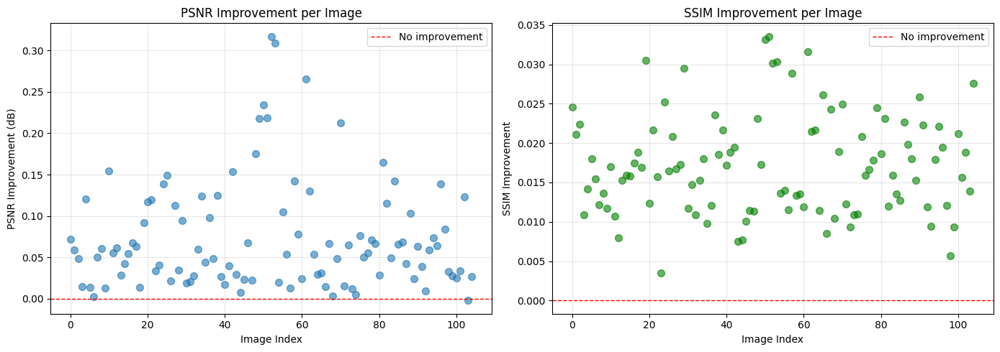

In [15]:
import csv

# Create metrics file
METRICS_PATH = Path("/content/drive/MyDrive/DL_Project/restoration_metrics.csv")

print("Computing and saving metrics for all restored images...")

# First, check what files exist
print("\nChecking directories...")
print(f"Damaged images: {len(list(DAMAGED_DIR.glob('*.png')))} files")
print(f"Clean images: {len(list(CLEAN_DIR.glob('*.png')))} files")
print(f"Restored images: {len(list(RESTORED_DIR.glob('*.png')))} files")

# Get list of restored files (they have _restored suffix)
restored_files = list(RESTORED_DIR.glob("*_restored.png"))
print(f"\nFound {len(restored_files)} restored images")

if len(restored_files) == 0:
    print("\nERROR: No restored images found!")
    print("Please run the restoration cell (Cell 9A) first to generate restored images.")
    print(f"Expected location: {RESTORED_DIR}")
else:
    results = []

    for restored_path in tqdm(restored_files, desc="Computing metrics"):
        try:
            # Extract original filename (remove _restored suffix)
            original_fname = restored_path.stem.replace("_restored", "") + ".png"

            # Check if corresponding files exist
            clean_path = CLEAN_DIR / original_fname
            damaged_path = DAMAGED_DIR / original_fname

            if not clean_path.exists():
                print(f"Warning: Clean image not found for {original_fname}")
                continue

            if not damaged_path.exists():
                print(f"Warning: Damaged image not found for {original_fname}")
                continue

            # Load images
            clean_pil = Image.open(clean_path).convert("RGB").resize((512, 512))
            damaged_pil = Image.open(damaged_path).convert("RGB").resize((512, 512))
            restored_pil = Image.open(restored_path).convert("RGB").resize((512, 512))

            # Convert to numpy
            clean_np = np.array(clean_pil).astype(np.float32)
            damaged_np = np.array(damaged_pil).astype(np.float32)
            restored_np = np.array(restored_pil).astype(np.float32)

            # Compute metrics
            psnr_damaged = psnr(clean_np, damaged_np, data_range=255)
            ssim_damaged = ssim(clean_np, damaged_np, data_range=255, channel_axis=2)
            psnr_restored = psnr(clean_np, restored_np, data_range=255)
            ssim_restored = ssim(clean_np, restored_np, data_range=255, channel_axis=2)

            results.append({
                'filename': original_fname,
                'psnr_damaged': psnr_damaged,
                'ssim_damaged': ssim_damaged,
                'psnr_restored': psnr_restored,
                'ssim_restored': ssim_restored,
                'psnr_improvement': psnr_restored - psnr_damaged,
                'ssim_improvement': ssim_restored - ssim_damaged
            })

        except Exception as e:
            print(f"Error computing metrics for {restored_path.name}: {e}")

    if len(results) > 0:
        # Save to CSV
        with open(METRICS_PATH, 'w', newline='') as csvfile:
            fieldnames = ['filename', 'psnr_damaged', 'ssim_damaged', 'psnr_restored',
                         'ssim_restored', 'psnr_improvement', 'ssim_improvement']
            writer = csv.DictWriter(csvfile, fieldnames=fieldnames)

            writer.writeheader()
            writer.writerows(results)

        print(f"\nMetrics saved to: {METRICS_PATH}")

        # Print summary statistics
        psnr_improvements = [r['psnr_improvement'] for r in results]
        ssim_improvements = [r['ssim_improvement'] for r in results]

        print("\n" + "="*60)
        print("SUMMARY STATISTICS")
        print("="*60)
        print(f"Total images processed: {len(results)}")

        # Damaged vs Clean
        avg_psnr_damaged = np.mean([r['psnr_damaged'] for r in results])
        avg_ssim_damaged = np.mean([r['ssim_damaged'] for r in results])

        # Restored vs Clean
        avg_psnr_restored = np.mean([r['psnr_restored'] for r in results])
        avg_ssim_restored = np.mean([r['ssim_restored'] for r in results])

        print(f"\nDamaged  → Clean | PSNR: {avg_psnr_damaged:.2f} ± {np.std([r['psnr_damaged'] for r in results]):.2f} dB | SSIM: {avg_ssim_damaged:.4f} ± {np.std([r['ssim_damaged'] for r in results]):.4f}")
        print(f"Restored → Clean | PSNR: {avg_psnr_restored:.2f} ± {np.std([r['psnr_restored'] for r in results]):.2f} dB | SSIM: {avg_ssim_restored:.4f} ± {np.std([r['ssim_restored'] for r in results]):.4f}")

        print(f"\nIMPROVEMENT:")
        print(f"PSNR Gain: {np.mean(psnr_improvements):+.2f} ± {np.std(psnr_improvements):.2f} dB")
        print(f"SSIM Gain: {np.mean(ssim_improvements):+.4f} ± {np.std(ssim_improvements):.4f}")

        if len(psnr_improvements) > 0:
            print(f"\nBest PSNR improvement: {max(psnr_improvements):+.2f} dB ({results[psnr_improvements.index(max(psnr_improvements))]['filename']})")
            print(f"Worst PSNR improvement: {min(psnr_improvements):+.2f} dB ({results[psnr_improvements.index(min(psnr_improvements))]['filename']})")
            print(f"\nBest SSIM improvement: {max(ssim_improvements):+.4f} ({results[ssim_improvements.index(max(ssim_improvements))]['filename']})")
            print(f"Worst SSIM improvement: {min(ssim_improvements):+.4f} ({results[ssim_improvements.index(min(ssim_improvements))]['filename']})")

        print("="*60)

        # Create visualization of improvements
        plt.figure(figsize=(14, 5))

        plt.subplot(1, 2, 1)
        plt.scatter(range(len(psnr_improvements)), psnr_improvements, alpha=0.6, s=50)
        plt.axhline(y=0, color='r', linestyle='--', linewidth=1, label='No improvement')
        plt.xlabel('Image Index')
        plt.ylabel('PSNR Improvement (dB)')
        plt.title('PSNR Improvement per Image')
        plt.grid(alpha=0.3)
        plt.legend()

        plt.subplot(1, 2, 2)
        plt.scatter(range(len(ssim_improvements)), ssim_improvements, alpha=0.6, s=50, color='green')
        plt.axhline(y=0, color='r', linestyle='--', linewidth=1, label='No improvement')
        plt.xlabel('Image Index')
        plt.ylabel('SSIM Improvement')
        plt.title('SSIM Improvement per Image')
        plt.grid(alpha=0.3)
        plt.legend()

        plt.tight_layout()
        plt.show()

    else:
        print("\nERROR: No results were computed. Check if files exist and match.")

Testing on: 086.png


  0%|          | 0/71 [00:00<?, ?it/s]

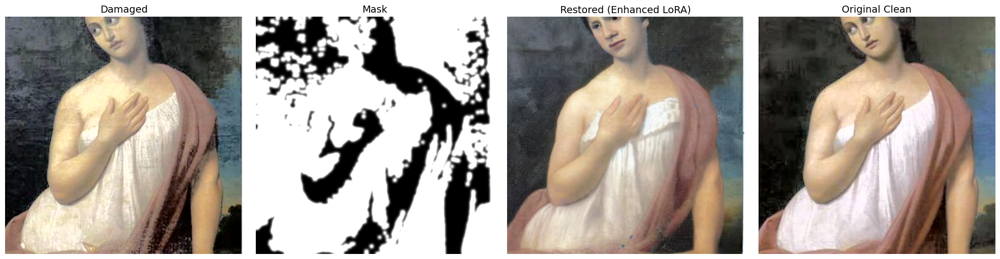


Damaged  → Clean | PSNR: 16.94 dB | SSIM: 0.4425
Restored → Clean | PSNR: 16.73 dB | SSIM: 0.5244
Improvement      | PSNR: -0.20 dB | SSIM: +0.0820


In [20]:
# Select a random test image to test restoration
fname = random.choice(os.listdir(DAMAGED_DIR))
print(f"Testing on: {fname}")

damaged_pil = Image.open(DAMAGED_DIR / fname).convert("RGB").resize((512, 512))
mask_pil = Image.open(MASK_DIR / fname).convert("L").resize((512, 512))
clean_pil = Image.open(CLEAN_DIR / fname).convert("RGB").resize((512, 512))

# Perform restoration
with torch.no_grad():
    restored_pil = pipe(
        prompt="professional museum-quality photo restoration, repair all damage, preserve original details and colors, natural skin texture, sharp details",
        negative_prompt="blur, artifacts, distortion, oversaturated, fake, synthetic, unnatural, scratches, cracks",
        image=damaged_pil,
        mask_image=mask_pil,
        num_inference_steps=75,
        guidance_scale=7.5,
        strength=0.95
    ).images[0]

# Display results
plt.figure(figsize=(20, 5))

plt.subplot(1, 4, 1)
plt.imshow(damaged_pil)
plt.title("Damaged", fontsize=14)
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(mask_pil, cmap="gray")
plt.title("Mask", fontsize=14)
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(restored_pil)
plt.title("Restored (Enhanced LoRA)", fontsize=14)
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(clean_pil)
plt.title("Original Clean", fontsize=14)
plt.axis("off")

plt.tight_layout()
plt.show()

# Compute metrics
p_damaged, s_damaged = psnr(np.array(clean_pil), np.array(damaged_pil), data_range=255), \
                       ssim(np.array(clean_pil), np.array(damaged_pil), data_range=255, channel_axis=2)
p_restored, s_restored = psnr(np.array(clean_pil), np.array(restored_pil), data_range=255), \
                         ssim(np.array(clean_pil), np.array(restored_pil), data_range=255, channel_axis=2)

print(f"\nDamaged  → Clean | PSNR: {p_damaged:.2f} dB | SSIM: {s_damaged:.4f}")
print(f"Restored → Clean | PSNR: {p_restored:.2f} dB | SSIM: {s_restored:.4f}")
print(f"Improvement      | PSNR: {p_restored - p_damaged:+.2f} dB | SSIM: {s_restored - s_damaged:+.4f}")

In [21]:
NUM_SAMPLES = 50

psnr_damaged_list = []
ssim_damaged_list = []
psnr_restored_list = []
ssim_restored_list = []

def tensor_to_pil(t, is_mask=False):
    """Convert tensor to PIL image"""
    if t.min() < 0:
        t = (t + 1) / 2

    t = t.squeeze().cpu().numpy()

    # Handle grayscale mask (2D)
    if is_mask or t.ndim == 2:
        t = (t * 255).clip(0, 255).astype(np.uint8)
        return Image.fromarray(t, mode='L')

    # Handle RGB image (3D)
    if t.ndim == 3:
        # If channels first (C, H, W), convert to (H, W, C)
        if t.shape[0] == 3 or t.shape[0] == 1:
            t = np.transpose(t, (1, 2, 0))
        t = (t * 255).clip(0, 255).astype(np.uint8)
        return Image.fromarray(t)

    raise ValueError(f"Unexpected tensor shape: {t.shape}")

print(f"Evaluating on {NUM_SAMPLES} samples...")

for _ in tqdm(range(NUM_SAMPLES)):
    idx = random.randint(0, len(dataset) - 1)
    sample = dataset[idx]

    # Convert tensors to PIL images
    clean_pil = tensor_to_pil(sample["clean"], is_mask=False)
    damaged_pil = tensor_to_pil(sample["damaged"], is_mask=False)
    mask_pil = tensor_to_pil(sample["mask"], is_mask=True)

    # Restore image
    with torch.no_grad():
        restored = pipe(
            prompt="professional photo restoration, repair damage completely, preserve identity and details, natural appearance",
            negative_prompt="blur, artifacts, scratches, cracks, distortion, fake",
            image=damaged_pil,
            mask_image=mask_pil,
            num_inference_steps=60,
            guidance_scale=7.0,
            strength=0.90
        ).images[0]

    # Compute metrics
    clean_np = np.array(clean_pil).astype(np.float32)
    damaged_np = np.array(damaged_pil).astype(np.float32)
    restored_np = np.array(restored).astype(np.float32)

    # Calculate PSNR and SSIM
    p_d = psnr(clean_np, damaged_np, data_range=255)
    s_d = ssim(clean_np, damaged_np, data_range=255, channel_axis=2)
    p_r = psnr(clean_np, restored_np, data_range=255)
    s_r = ssim(clean_np, restored_np, data_range=255, channel_axis=2)

    psnr_damaged_list.append(p_d)
    ssim_damaged_list.append(s_d)
    psnr_restored_list.append(p_r)
    ssim_restored_list.append(s_r)

# Final results
print("\n" + "="*60)
print("FINAL EVALUATION RESULTS")
print("="*60)

print(f"\nDamaged  → Clean | PSNR: {np.mean(psnr_damaged_list):.2f} ± {np.std(psnr_damaged_list):.2f} dB | SSIM: {np.mean(ssim_damaged_list):.4f} ± {np.std(ssim_damaged_list):.4f}")
print(f"Restored → Clean | PSNR: {np.mean(psnr_restored_list):.2f} ± {np.std(psnr_restored_list):.2f} dB | SSIM: {np.mean(ssim_restored_list):.4f} ± {np.std(ssim_restored_list):.4f}")

print(f"\nIMPROVEMENT:")
psnr_gain = np.mean(psnr_restored_list) - np.mean(psnr_damaged_list)
ssim_gain = np.mean(ssim_restored_list) - np.mean(ssim_damaged_list)

print(f"PSNR Gain: {psnr_gain:+.2f} dB ({'+' if psnr_gain > 0 else ''}{(psnr_gain/np.mean(psnr_damaged_list))*100:.1f}%)")
print(f"SSIM Gain: {ssim_gain:+.4f} ({'+' if ssim_gain > 0 else ''}{(ssim_gain/np.mean(ssim_damaged_list))*100:.1f}%)")
print("="*60)

# Show best and worst restorations
best_idx = np.argmax(np.array(psnr_restored_list) - np.array(psnr_damaged_list))
worst_idx = np.argmin(np.array(psnr_restored_list) - np.array(psnr_damaged_list))

print(f"\nBest restoration improvement: +{psnr_restored_list[best_idx] - psnr_damaged_list[best_idx]:.2f} dB")
print(f"Worst restoration improvement: {psnr_restored_list[worst_idx] - psnr_damaged_list[worst_idx]:+.2f} dB")

Evaluating on 50 samples...


  0%|          | 0/50 [00:00<?, ?it/s]/tmp/ipython-input-582722489.py:18: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  return Image.fromarray(t, mode='L')


  0%|          | 0/54 [00:00<?, ?it/s]

  2%|▏         | 1/50 [00:11<09:27, 11.59s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

  4%|▍         | 2/50 [00:23<09:20, 11.67s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

  6%|▌         | 3/50 [00:35<09:08, 11.68s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

  8%|▊         | 4/50 [00:46<08:53, 11.60s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 10%|█         | 5/50 [00:57<08:39, 11.54s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 12%|█▏        | 6/50 [01:09<08:25, 11.49s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 14%|█▍        | 7/50 [01:20<08:13, 11.47s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 16%|█▌        | 8/50 [01:32<08:01, 11.47s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 18%|█▊        | 9/50 [01:43<07:50, 11.49s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 20%|██        | 10/50 [01:55<07:39, 11.50s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 22%|██▏       | 11/50 [02:06<07:28, 11.50s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 24%|██▍       | 12/50 [02:18<07:16, 11.49s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 26%|██▌       | 13/50 [02:29<07:04, 11.47s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 28%|██▊       | 14/50 [02:41<06:52, 11.47s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 30%|███       | 15/50 [02:52<06:41, 11.46s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 32%|███▏      | 16/50 [03:04<06:30, 11.47s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 34%|███▍      | 17/50 [03:15<06:18, 11.47s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 36%|███▌      | 18/50 [03:26<06:07, 11.47s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 38%|███▊      | 19/50 [03:38<05:55, 11.47s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 40%|████      | 20/50 [03:49<05:44, 11.49s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 42%|████▏     | 21/50 [04:01<05:32, 11.48s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 44%|████▍     | 22/50 [04:12<05:20, 11.46s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 46%|████▌     | 23/50 [04:24<05:09, 11.46s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 48%|████▊     | 24/50 [04:35<04:58, 11.46s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 50%|█████     | 25/50 [04:47<04:46, 11.47s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 52%|█████▏    | 26/50 [04:58<04:35, 11.47s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 54%|█████▍    | 27/50 [05:10<04:24, 11.48s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 56%|█████▌    | 28/50 [05:21<04:12, 11.49s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 58%|█████▊    | 29/50 [05:33<04:01, 11.49s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 60%|██████    | 30/50 [05:44<03:49, 11.49s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 62%|██████▏   | 31/50 [05:56<03:38, 11.48s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 64%|██████▍   | 32/50 [06:07<03:26, 11.48s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 66%|██████▌   | 33/50 [06:19<03:14, 11.47s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 68%|██████▊   | 34/50 [06:30<03:03, 11.46s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 70%|███████   | 35/50 [06:42<02:52, 11.47s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 72%|███████▏  | 36/50 [06:53<02:40, 11.49s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 74%|███████▍  | 37/50 [07:05<02:29, 11.50s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 76%|███████▌  | 38/50 [07:16<02:17, 11.50s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 78%|███████▊  | 39/50 [07:28<02:06, 11.50s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 80%|████████  | 40/50 [07:39<01:54, 11.49s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 82%|████████▏ | 41/50 [07:51<01:43, 11.48s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 84%|████████▍ | 42/50 [08:02<01:31, 11.46s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 86%|████████▌ | 43/50 [08:13<01:20, 11.47s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 88%|████████▊ | 44/50 [08:25<01:08, 11.48s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 90%|█████████ | 45/50 [08:36<00:57, 11.48s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 92%|█████████▏| 46/50 [08:48<00:45, 11.49s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 94%|█████████▍| 47/50 [08:59<00:34, 11.49s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 96%|█████████▌| 48/50 [09:11<00:22, 11.49s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

 98%|█████████▊| 49/50 [09:22<00:11, 11.47s/it]

  0%|          | 0/54 [00:00<?, ?it/s]

100%|██████████| 50/50 [09:34<00:00, 11.49s/it]


FINAL EVALUATION RESULTS

Damaged  → Clean | PSNR: 13.15 ± 2.40 dB | SSIM: 0.2762 ± 0.0993
Restored → Clean | PSNR: 12.60 ± 1.86 dB | SSIM: 0.3115 ± 0.1024

IMPROVEMENT:
PSNR Gain: -0.54 dB (-4.1%)
SSIM Gain: +0.0353 (+12.8%)

Best restoration improvement: +1.35 dB
Worst restoration improvement: -3.82 dB


In [22]:
# Create output directory for restored images
RESTORED_DIR = Path("/content/drive/MyDrive/DL_Project/restored images")
RESTORED_DIR.mkdir(parents=True, exist_ok=True)

print(f"Restoring and saving all damaged images to: {RESTORED_DIR}")
print("="*60)

# Process all damaged images
damaged_files = sorted([f for f in os.listdir(DAMAGED_DIR) if f.lower().endswith(('.png', '.jpg', '.jpeg'))])

for fname in tqdm(damaged_files, desc="Restoring images"):
    try:
        # Load images
        damaged_pil = Image.open(DAMAGED_DIR / fname).convert("RGB").resize((512, 512))
        mask_pil = Image.open(MASK_DIR / fname).convert("L").resize((512, 512))

        # Perform restoration
        with torch.no_grad():
            restored_pil = pipe(
                prompt="professional museum-quality photo restoration, repair all damage, preserve original details and colors, natural skin texture, sharp details",
                negative_prompt="blur, artifacts, distortion, oversaturated, fake, synthetic, unnatural, scratches, cracks",
                image=damaged_pil,
                mask_image=mask_pil,
                num_inference_steps=75,
                guidance_scale=7.5,
                strength=0.95
            ).images[0]

        # Save restored image
        output_name = Path(fname).stem + "_restored.png"
        restored_pil.save(RESTORED_DIR / output_name, format="PNG")

    except Exception as e:
        print(f"Error restoring {fname}: {e}")

print(f"\nAll restored images saved to: {RESTORED_DIR}")
print(f"Total images restored: {len(list(RESTORED_DIR.glob('*.png')))}")

Restoring and saving all damaged images to: /content/drive/MyDrive/DL_Project/restored images


Restoring images:   0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:   1%|          | 1/109 [00:14<26:45, 14.87s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:   2%|▏         | 2/109 [00:29<26:37, 14.93s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:   3%|▎         | 3/109 [00:44<26:22, 14.93s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:   4%|▎         | 4/109 [00:59<26:05, 14.91s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:   5%|▍         | 5/109 [01:14<25:49, 14.90s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:   6%|▌         | 6/109 [01:29<25:33, 14.89s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:   6%|▋         | 7/109 [01:44<25:17, 14.88s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:   7%|▋         | 8/109 [01:59<25:02, 14.88s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:   8%|▊         | 9/109 [02:13<24:46, 14.87s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:   9%|▉         | 10/109 [02:28<24:33, 14.88s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  10%|█         | 11/109 [02:43<24:18, 14.88s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  11%|█         | 12/109 [02:58<24:01, 14.86s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  12%|█▏        | 13/109 [03:13<23:46, 14.86s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  13%|█▎        | 14/109 [03:28<23:33, 14.88s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  14%|█▍        | 15/109 [03:43<23:19, 14.89s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  15%|█▍        | 16/109 [03:58<23:05, 14.89s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  16%|█▌        | 17/109 [04:13<22:50, 14.90s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  17%|█▋        | 18/109 [04:27<22:35, 14.90s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  17%|█▋        | 19/109 [04:42<22:18, 14.87s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  18%|█▊        | 20/109 [04:57<22:02, 14.86s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  19%|█▉        | 21/109 [05:12<21:49, 14.88s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  20%|██        | 22/109 [05:27<21:35, 14.89s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  21%|██        | 23/109 [05:42<21:19, 14.87s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  22%|██▏       | 24/109 [05:57<21:02, 14.86s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  23%|██▎       | 25/109 [06:11<20:47, 14.86s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  24%|██▍       | 26/109 [06:26<20:33, 14.86s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  25%|██▍       | 27/109 [06:41<20:20, 14.88s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  26%|██▌       | 28/109 [06:56<20:07, 14.91s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  27%|██▋       | 29/109 [07:11<19:52, 14.91s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  28%|██▊       | 30/109 [07:26<19:36, 14.90s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  28%|██▊       | 31/109 [07:41<19:19, 14.87s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  29%|██▉       | 32/109 [07:56<19:04, 14.86s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  30%|███       | 33/109 [08:11<18:49, 14.86s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  31%|███       | 34/109 [08:25<18:35, 14.87s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  32%|███▏      | 35/109 [08:40<18:23, 14.91s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  33%|███▎      | 36/109 [08:55<18:08, 14.90s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  34%|███▍      | 37/109 [09:10<17:51, 14.89s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  35%|███▍      | 38/109 [09:25<17:34, 14.86s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  36%|███▌      | 39/109 [09:40<17:20, 14.86s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  37%|███▋      | 40/109 [09:55<17:06, 14.88s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  38%|███▊      | 41/109 [10:10<16:51, 14.88s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  39%|███▊      | 42/109 [10:25<16:44, 14.99s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  39%|███▉      | 43/109 [10:40<16:28, 14.98s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  40%|████      | 44/109 [10:55<16:12, 14.96s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  41%|████▏     | 45/109 [11:10<15:56, 14.94s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  42%|████▏     | 46/109 [11:25<15:40, 14.93s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  43%|████▎     | 47/109 [11:39<15:24, 14.91s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  44%|████▍     | 48/109 [11:54<15:09, 14.90s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  45%|████▍     | 49/109 [12:09<14:53, 14.90s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  46%|████▌     | 50/109 [12:24<14:39, 14.91s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  47%|████▋     | 51/109 [12:39<14:24, 14.90s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  48%|████▊     | 52/109 [12:54<14:07, 14.88s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  49%|████▊     | 53/109 [13:09<13:52, 14.87s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  50%|████▉     | 54/109 [13:24<13:38, 14.89s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  50%|█████     | 55/109 [13:39<13:24, 14.90s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  51%|█████▏    | 56/109 [13:53<13:08, 14.87s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  52%|█████▏    | 57/109 [14:08<12:52, 14.85s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  53%|█████▎    | 58/109 [14:23<12:38, 14.88s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  54%|█████▍    | 59/109 [14:38<12:24, 14.88s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  55%|█████▌    | 60/109 [14:53<12:08, 14.87s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  56%|█████▌    | 61/109 [15:08<11:53, 14.87s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  57%|█████▋    | 62/109 [15:23<11:39, 14.87s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  58%|█████▊    | 63/109 [15:37<11:24, 14.88s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  59%|█████▊    | 64/109 [15:52<11:09, 14.88s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  60%|█████▉    | 65/109 [16:07<10:54, 14.87s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  61%|██████    | 66/109 [16:22<10:38, 14.86s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  61%|██████▏   | 67/109 [16:37<10:23, 14.85s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  62%|██████▏   | 68/109 [16:52<10:09, 14.88s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  63%|██████▎   | 69/109 [17:07<09:55, 14.90s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  64%|██████▍   | 70/109 [17:22<09:41, 14.90s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  65%|██████▌   | 71/109 [17:37<09:25, 14.89s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  66%|██████▌   | 72/109 [17:51<09:10, 14.88s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  67%|██████▋   | 73/109 [18:06<08:55, 14.87s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  68%|██████▊   | 74/109 [18:21<08:39, 14.86s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  69%|██████▉   | 75/109 [18:36<08:25, 14.86s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  70%|██████▉   | 76/109 [18:51<08:10, 14.86s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  71%|███████   | 77/109 [19:06<07:56, 14.88s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  72%|███████▏  | 78/109 [19:21<07:41, 14.88s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  72%|███████▏  | 79/109 [19:35<07:26, 14.87s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  73%|███████▎  | 80/109 [19:50<07:11, 14.88s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  74%|███████▍  | 81/109 [20:05<06:57, 14.90s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  75%|███████▌  | 82/109 [20:20<06:42, 14.90s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  76%|███████▌  | 83/109 [20:35<06:26, 14.87s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  77%|███████▋  | 84/109 [20:50<06:11, 14.87s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  78%|███████▊  | 85/109 [21:05<05:56, 14.87s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  79%|███████▉  | 86/109 [21:20<05:41, 14.87s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  80%|███████▉  | 87/109 [21:34<05:27, 14.88s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  81%|████████  | 88/109 [21:49<05:12, 14.90s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  82%|████████▏ | 89/109 [22:04<04:57, 14.88s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  83%|████████▎ | 90/109 [22:19<04:42, 14.87s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  83%|████████▎ | 91/109 [22:34<04:27, 14.86s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  84%|████████▍ | 92/109 [22:49<04:12, 14.86s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  85%|████████▌ | 93/109 [23:04<03:57, 14.87s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  86%|████████▌ | 94/109 [23:19<03:43, 14.89s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  87%|████████▋ | 95/109 [23:34<03:28, 14.89s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  88%|████████▊ | 96/109 [23:48<03:13, 14.88s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  89%|████████▉ | 97/109 [24:03<02:58, 14.88s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  90%|████████▉ | 98/109 [24:18<02:43, 14.86s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  91%|█████████ | 99/109 [24:33<02:28, 14.86s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  92%|█████████▏| 100/109 [24:48<02:13, 14.88s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  93%|█████████▎| 101/109 [25:03<01:59, 14.90s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  94%|█████████▎| 102/109 [25:18<01:44, 14.89s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  94%|█████████▍| 103/109 [25:32<01:29, 14.87s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  95%|█████████▌| 104/109 [25:47<01:14, 14.86s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  96%|█████████▋| 105/109 [26:02<00:59, 14.85s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  97%|█████████▋| 106/109 [26:17<00:44, 14.86s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  98%|█████████▊| 107/109 [26:32<00:29, 14.88s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images:  99%|█████████▉| 108/109 [26:47<00:14, 14.89s/it]

  0%|          | 0/71 [00:00<?, ?it/s]

Restoring images: 100%|██████████| 109/109 [27:02<00:00, 14.88s/it]


All restored images saved to: /content/drive/MyDrive/DL_Project/restored images
Total images restored: 109
